# **Introdução**

A análise exploratória dos dados ou Exploratory Data Analysis(EDA)
é o processo de analisar e resumir as principais características de um conjunto de dados, muitas vezes com o objetivo de compreender os padrões, relacionamentos e tendências existentes.

A EDA é a primeira etapa fundamental para o desenvolvimento de insights ou modelos, podendo ser um processo demorado e trabalhoso quando se estiver tratando grande bases de dados.

Felizmente hoje existem ferramentas que facilitam esse processo e conseguem entregar resultados surpreendentes, umas delas é o **sweetviz**.

O framework **sweetviz** é uma biblioteca aberta em python, a qual  permite analisar as principais caracteristicas e relações existentes em um conjunto de dados com poucas linhas de código.

O output do **sweetviz** é em HTML e gera resultados como:

**Resumo de métricas por variáveis** = o framewoork infere por variáveis medidas como soma, média, mediana, variância, desvio padrão, mínimos, máximos, amplitude, quartis, assimetria, curtose, quantidade de valores destintos e percentual de missing.

**Comparação de bases** = o pacote permite compara as medidas de distribuição das variáveis entre bases distintas, como por exemplo, comparar bases de treino e teste de um modelo ou dados de ocorrências de anos diferentes.

**Análises de target** = A ferramenta permite você determinar uma coluna target, como por exemplo um modelo de clasificação, assim entregando insights de como a variável dependente (Target) se comportar por variáveis independentes (Features).


Aqui vai um depoimento pessoal, eu utilizo o sweetviz no meu dia a dia por que ele aguenta o "tranco" do trabalho, já apliquei ele em bases de 5 até 10 milhōes de registros aproximadamente e ele conseguiu processar sem problemas, ao contrário de outros pacotes como Pandas Profiling ou Dataprep, que comigo tiveram problemas em lidar com grandes volumes de dados e precisaram de uma amostragem dos dados para realizar as análises.


### **Importando pacotes**

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 500)


### **Determinando diretório de arquivo**

In [2]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive
%cd My Drive
%cd Portfólio CD
%cd Sweetviz
%cd 0_Bases

%ls

Mounted at /gdrive
/gdrive
/gdrive/My Drive
/gdrive/My Drive/Portfólio CD
/gdrive/My Drive/Portfólio CD/Sweetviz
/gdrive/My Drive/Portfólio CD/Sweetviz/0_Bases
Base_Inadimplencia.csv  Dicionario_Base_Inadimplencia.xlsx


### **Conhecendo nossa base**

A base que utilizaremos no exemplo trata-se de dados para modelagem de inadimplência e contém dados financeiros de clientes hipotéticos de um banco.

As colunas que devemos destarcar são:
- **CHAVE_CLIENTE** valor numérico único que identifica cada cliente

- **DEFAULT_IND** coluna binária, onde 0 indica clientes adimplentes e 1 identifica os clientes inadimplentes, ou seja, nosso **target**

As demais colunas são definidas como:




|Variável|Descrição|
|:------------|:------------:|
|SCORE_CREDITO_HIST|Pontuação de crédito calculada com base no histórico de crédito do tomador|
|RENDA_ANUAL|Renda anual em dólar|
|VALOR_PROPRIEDADE_TOMADOR|Valor de mercado estimado de uma propriedade de propriedade usada pelo tomador de crédito em dólar|
|TEMPO_MORADIA_ATUAL_ANOS|Duração da estadia no endereço residencial atual (em anos)|
|QTD_CARTAO_CREDITO_LIMITE_TOTAL_UTILIZADO|Número de cartões de crédito ativos nos quais o limite de crédito total é utilizado pelo tomador de crédito|
|QTD_CARTAO_CREDITO_ATIVOS_75%_LIMITE_UTILIZADO|Número de cartões de crédito ativos nos quais o limite de crédito de pelo menos 75% é utilizado pelo tomador de crédito|
|PRAZO_LINHA_CREDITO_MAIS_ANTIGA_DIAS|Prazo da linha de crédito mais antiga (em dias)|
|PRAZO_MAXIMO_EMPRESTIMO_AUTO_DIAS|Prazo máximo de todos os empréstimos para automóveis (em dias)|
|PRAZO_MAXIMO_EMPRESTIMO_EDUCACIONAL_DIAS|Prazo máximo de todos os empréstimos educacionais (em dias)|
|QTD_LINHAS_CREDITO_ATIVAS|Número de linhas de crédito ativas|
|QTD_LINHAS_CREDITO_ATIVADAS_ULTMS_2ANOS|Número de linhas de crédito ativadas nos últimos 2 anos|
|INDICE_STRESS_FINANCEIRO|Índice de estresse financeiro do tomador de crédito. Este índice é uma função de negócios de cobrança e arquivos de falências|
|TIPO_PRODUTO_SOLICITADO|Tipo de produto que o requerente solicitou. (C = Encargo L = Empréstimo)|



In [17]:
#Lendo arquivo csv da base
df_analise = pd.read_csv('Base_Inadimplencia.csv', sep=',')

#Renomeando colunas
dict_col_names = {
'application_key':'CHAVE_CLIENTE',
'mvar1':'SCORE_CREDITO_HIST',
'mvar2':'SCORE_CONSULTA_CREDITO',
'mvar3':'GRAVIDADE_EMPRESTIMO_GERAL',
'mvar4':'GRAVIDADE_EMPRESTIMO_AUTO',
'mvar5':'GRAVIDADE_EMPRESTIMO_EDUCACIONAL',
'mvar6':'CREDITO_MINIMO_CARTAO_ROTATIVO',
'mvar7':'MAXINO_CREDITO_ATIVO_DISP',
'mvar8':'CREDITO_MAXIMO_CARTAO_ROTATIVO',
'mvar9':'SOMA_CREDITO_DISP_CARTAO_1_DEFAULT',
'mvar10':'CREDITO_TOTAL_LINHAS_ACEITAS',
'mvar11':'TX_COBRADA_INAD_SUP_500',
'mvar12':'SOMA_VALOR_DEVIDO_CARTAO_CREDITO_ATIVO',
'mvar13':'TOTAL_PAGO_CARTAO_CREDITO_ANO_ANTERIOR',
'mvar14':'RENDA_ANUAL',
'mvar15':'VALOR_PROPRIEDADE_TOMADOR',
'mvar16':'QTD_CARTAO_CREDITO_ROTATIVO_LIMITE_TOTAL_UTILIZADO',
'mvar17':'QTD_CARTAO_CREDITO_LIMITE_TOTAL_UTILIZADO',
'mvar18':'QTD_LINHAS_CREDITO_ATIVAS_LIMITE_TOTAL_UTILIZADO',
'mvar19':'QTD_CARTAO_CREDITO_ATIVOS_75%_LIMITE_UTILIZADO',
'mvar20':'QTD_LINHAS_CREDITO_ATIVAS_75%_LIMITE_UTILIZADO',
'mvar21':'UTILIZACAO_%_MEDIA_EMPRESTIMOS_ATIVOS',
'mvar22':'UTILIZACAO_%_MEDIA_LINHAS_CREDITO_ATIVAS_ULTMS_2ANOS',
'mvar23':'UTILIZACAO_%_MEDIA_CARTAO_CREDITO_ATIVO_ULTMS_1ANO',
'mvar24':'UTILIZACAO_%_MEDIA_CARTAO_CREDITO_1_DEFAULT_ULTMS_6MESES',
'mvar25':'TEMPO_MEDIO_CREDITO_ROTATIVO_CARTAO_DIAS',
'mvar26':'IDADE_CARTAO_CREDITO_MAIS ANTIGO_DIAS',
'mvar27':'IDADE_CARTAO_CREDITO_ROTATIVO_MAIS ANTIGO_DIAS',
'mvar28':'QTD_DIAS_ULTM_PAGAMENTO_PERDIDO',
'mvar29':'PRAZO_LINHA_CREDITO_MAIS_ANTIGA_DIAS',
'mvar30':'PRAZO_MAXIMO_EMPRESTIMO_AUTO_DIAS',
'mvar31':'PRAZO_MAXIMO_EMPRESTIMO_EDUCACIONAL_DIAS',
'mvar32':'SOMA_PRAZO_CARTOES_CREDITO_ATIVOS_MESES',
'mvar33':'TEMPO_MORADIA_ATUAL_ANOS',
'mvar34':'QTD_LINAS_CREDITO_ATIVAS_ULTMS_6MESES_1_DEFAULT',
'mvar35':'QTD_CARTOES_CREDITO_ROTATIVO_ULTMS_2ANOS_1_DEFAULT',
'mvar36':'QTD_LINHAS_CREDITO_ATIVAS',
'mvar37':'QTD_CARTOES_CREDITO_C_MANDATO_ATIVO_ULTMS_2ANOS',
'mvar38':'QTD_LINHAS_CREDITO_ATIVADAS_ULTMS_2ANOS',
'mvar39':'QTD_LINHAS_CREDITO_EM_DEFAULT_ATUALMENTE',
'mvar40':'UTILIZACAO_%_EMPRESTIMOS_EDUCACIONAIS_ATIVOS',
'mvar41':'UTILIZACAO_%_FINANCIAMENTO_VEICULOS_ATIVOS',
'mvar42':'INDICE_STRESS_FINANCEIRO',
'mvar43':'QTD_LINHA_CREDITO_SEMPRE_PAGO_ULTMS_2ANOS_ALTO_RISCO',
'mvar44':'PROP_VALOR_MAXIMO_DEVIDO_SOBRE_SOMA_VALORES_DEVIDOS',
'mvar45':'QTD_EMPRESTIMO_HIPOTECARIOS_COM_2_DEFAULTS',
'mvar46':'QTD_EMPRESTIMO_AUTO_COM_2_DEFAULTS',
'mvar47':'TIPO_PRODUTO_SOLICITADO',
'default_ind':'DEFAULT_IND'}

df_analise.rename(columns=dict_col_names,inplace=True)

#Ajustando formato das colunas, subistituindo os strings 'na' ou 'missing' por np.NaN
df_analise.replace(['missing','na'],np.nan,inplace=True)

#Formatando colunas numéricas para float
FLOAT_COL = list(df_analise.drop(columns=['TIPO_PRODUTO_SOLICITADO','CHAVE_CLIENTE','DEFAULT_IND']).columns)
df_analise[FLOAT_COL] = df_analise[FLOAT_COL].astype(np.float64)

#Selecionando colunas que serão analisadas para o notebook nao ficar muito pesado
df_analise = df_analise[['CHAVE_CLIENTE','SCORE_CREDITO_HIST',
            'RENDA_ANUAL','QTD_CARTAO_CREDITO_LIMITE_TOTAL_UTILIZADO','QTD_CARTAO_CREDITO_ATIVOS_75%_LIMITE_UTILIZADO',
            'PRAZO_LINHA_CREDITO_MAIS_ANTIGA_DIAS','PRAZO_MAXIMO_EMPRESTIMO_AUTO_DIAS','PRAZO_MAXIMO_EMPRESTIMO_EDUCACIONAL_DIAS',
            'VALOR_PROPRIEDADE_TOMADOR','TEMPO_MORADIA_ATUAL_ANOS','QTD_LINHAS_CREDITO_ATIVAS',
            'QTD_LINHAS_CREDITO_ATIVADAS_ULTMS_2ANOS','INDICE_STRESS_FINANCEIRO','TIPO_PRODUTO_SOLICITADO','DEFAULT_IND']].copy()

#Amostra da base
df_analise.sample(10)

<ipython-input-17-9dc4e7f1aad7>:2: DtypeWarning: Columns (19) have mixed types. Specify dtype option on import or set low_memory=False.
  df_analise = pd.read_csv('Base_Inadimplencia.csv', sep=',')


,CHAVE_CLIENTE,SCORE_CREDITO_HIST,RENDA_ANUAL,QTD_CARTAO_CREDITO_LIMITE_TOTAL_UTILIZADO,QTD_CARTAO_CREDITO_ATIVOS_75%_LIMITE_UTILIZADO,PRAZO_LINHA_CREDITO_MAIS_ANTIGA_DIAS,PRAZO_MAXIMO_EMPRESTIMO_AUTO_DIAS,PRAZO_MAXIMO_EMPRESTIMO_EDUCACIONAL_DIAS,VALOR_PROPRIEDADE_TOMADOR,TEMPO_MORADIA_ATUAL_ANOS,QTD_LINHAS_CREDITO_ATIVAS,QTD_LINHAS_CREDITO_ATIVADAS_ULTMS_2ANOS,INDICE_STRESS_FINANCEIRO,TIPO_PRODUTO_SOLICITADO,DEFAULT_IND
72997,303029,1827.0,118920.0,0.0,2.0,8851.0,8851.0,7695.0,279625.0,33.2500,7.0,2.0,0.00000,L,0
27778,257810,1678.0,5946.0,NaN,0.0,7604.0,NaN,7604.0,NaN,1.4167,3.0,0.0,0.50000,C,1
13927,243959,1685.0,42613.0,NaN,0.0,6540.0,2038.0,NaN,NaN,2.3333,2.0,3.0,0.46154,C,0
58438,288470,1726.0,49550.0,NaN,0.0,5627.0,2707.0,NaN,NaN,15.4167,3.0,3.0,0.23077,C,0
54493,284525,1782.0,89190.0,0.0,0.0,7270.0,1916.0,NaN,193658.0,2.0833,7.0,4.0,0.17647,C,0
45977,276009,1735.0,19820.0,NaN,0.0,7848.0,NaN,7848.0,NaN,15.6667,1.0,0.0,0.50000,L,0
49416,279448,1913.0,39640.0,0.0,0.0,12106.0,NaN,NaN,292345.0,6.6667,2.0,0.0,0.00000,L,0
37279,267311,1839.0,56487.0,0.0,0.0,4198.0,NaN,NaN,161633.0,3.9167,NaN,5.0,NaN,C,0
17695,247727,1895.0,123875.0,0.0,0.0,8060.0,NaN,NaN,336940.0,3.2500,4.0,0.0,0.00000,L,0
35520,265552,1705.0,97118.0,0.0,2.0,5201.0,NaN,NaN,NaN,0.3333,3.0,2.0,0.14286,C,0


### **Instalando o pacote**

In [ ]:
pip install sweetviz

### **Aplicando o pacote**

In [6]:
import sweetviz as sv

Vou passar aqui como eu utilizo o framework no meu cotidiano, e tentar elucidar da melhor forma possível a aplicação, para dúvidas que não consegui abordar aconselho consultar a documentação:

https://pypi.org/project/sweetviz/

**Passo a passo da aplicação**

1º Criando objeto de configuração de variáveis, vale relembrar que essa etapa é opcional.

  Parâmetros:

  skip = lista de colunas que serão ignoradas no relatório, no exemplo estou ignorando a coluna 'aplication_key', por não ser um feature e apenas uma chave de identificação dos registros.

  force_cat = lista de colunas categóricas, no nosso exemplo iremos considerar as colunas 'TIPO_PRODUTO_SOLICITADA' e 'TARGET', sendo a segunda apenas com o propósito de verfificar suas caracteristicas de forma isolada.

  force_num= lista de colunas numérica para o relatório, nessa caso serão todas as demais além das supracitadas.


2º Gerando relatório

Parâmetros:

  **source**, primeiro passamos uma lista contendo o dataframe a ser analisado e um string com o nome de desejamos atribuir ao dataframe, sendo o string opicional, pode-se passar apenas o dataframe diretamente.

  **feat_config** objeto de formatação das variáveis criado no primeiro passo


3º Visualizando relatório no notebook

Esse comando permite visualizar o relatório no prório notebook de execução, outra opção é o comando .show_html(), que gera o relatório em um arquivo HTML na pasta do notebook.










                                             |          | [  0%]   00:00 -> (? left)


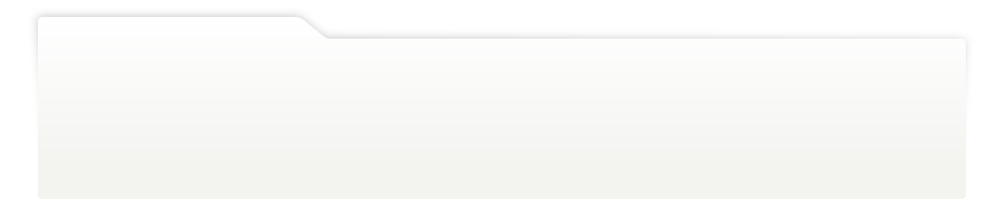
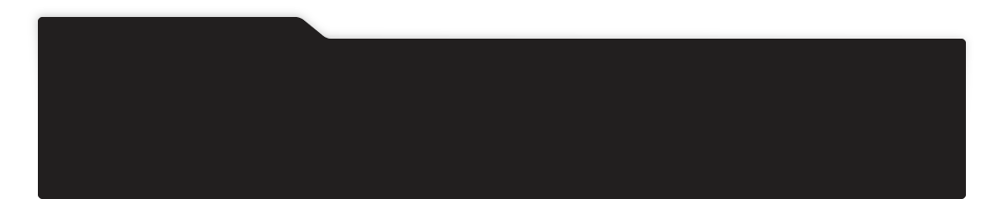
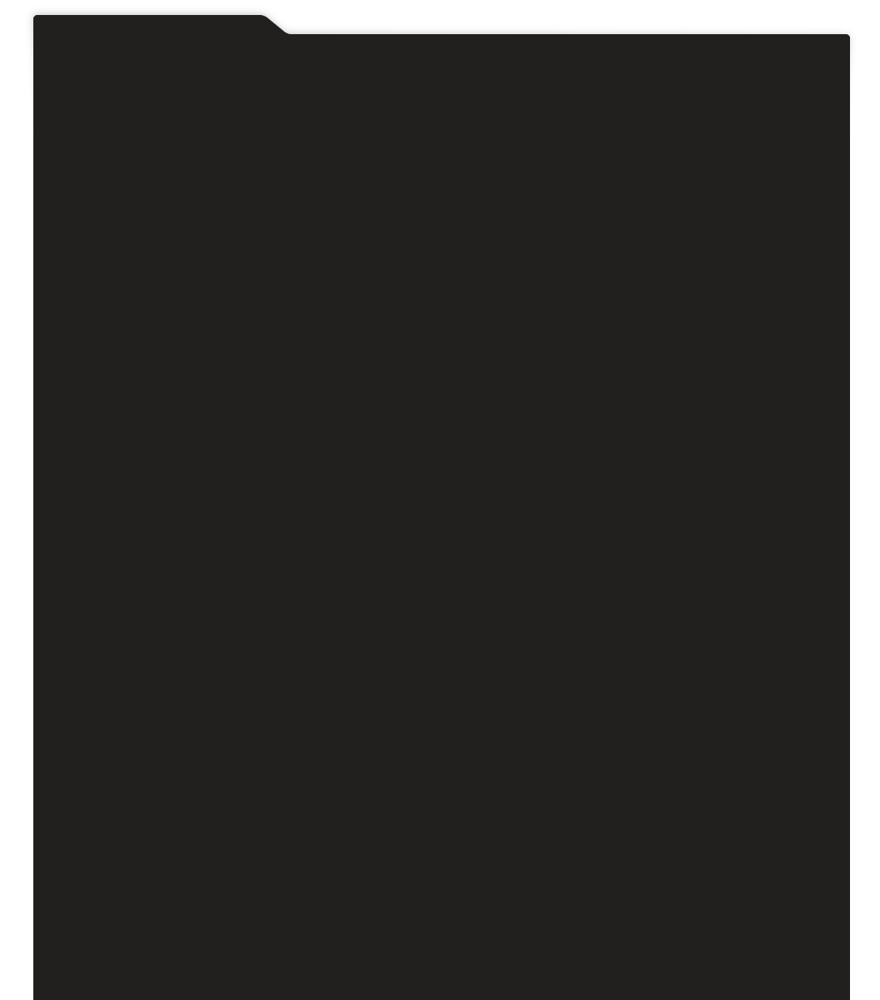
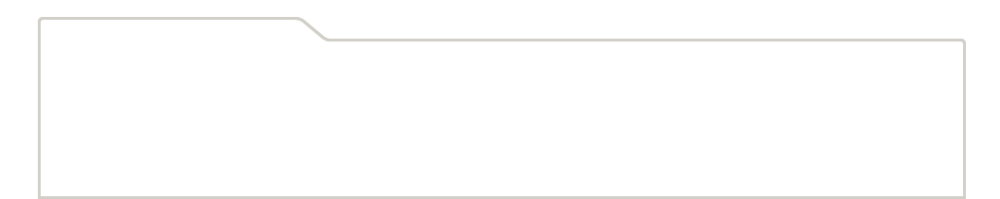
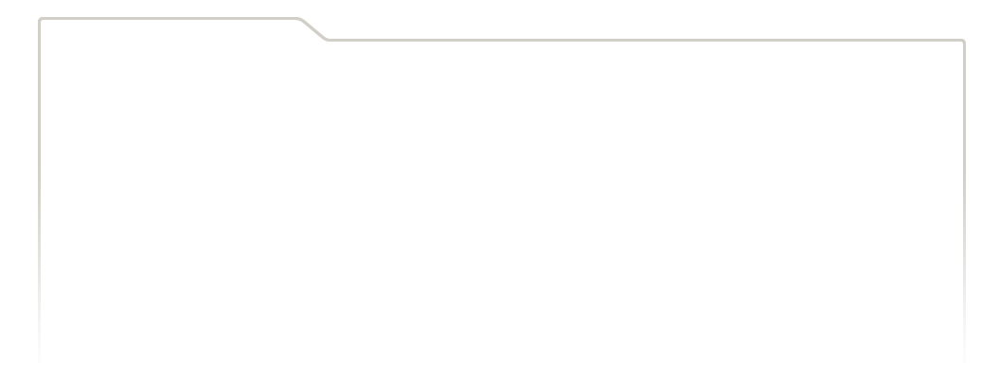
...
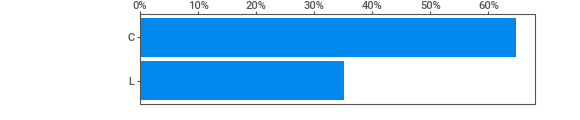
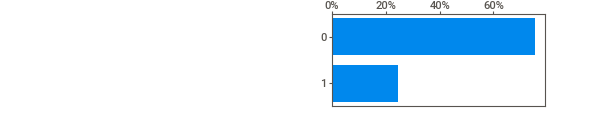
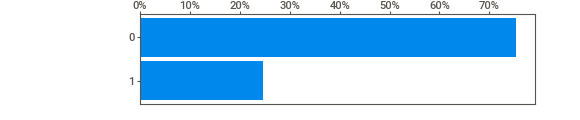
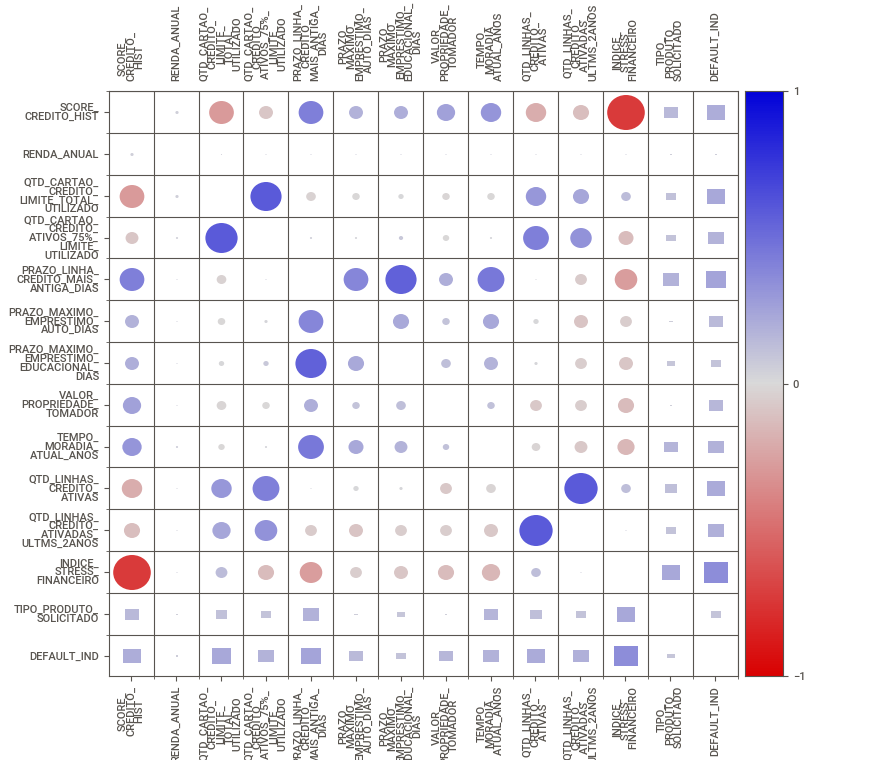
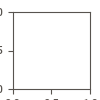

In [18]:
#1 - Criando objeto de configuração de variáveis

vars_config = sv.FeatureConfig(skip=['CHAVE_CLIENTE'],
                 force_cat=['TIPO_PRODUTO_SOLICITADO','DEFAULT_IND'],
                 force_num=df_analise.drop(columns=['TIPO_PRODUTO_SOLICITADO','DEFAULT_IND']).columns.tolist())

#2 - Gerando relatório
relatorio = sv.analyze(source=[df_analise,'Base de Crédito'], feat_cfg=vars_config)

#3 - Visualizando relatório no notebook
relatorio.show_notebook()

#### **Detalhamento de análises**

No HTML gerado pelo sweetviz temos a possibilidae de expandir as análises de cada variável ao clicar em suas "abas", na imagem abaixo temos como exemplo o detalhamento da variável 'SCORE_CREDITO_HIST' e vamos usa-lá para destacar alguns insights que o relatório proporciona.

No canto superior esquerdo vemos logo de cara que dos 80k registros, a variável possui 5% dos registros como missing e assume 454 valores distintos.

Outra possibilidade é aumentar ou diminuir as quebras ou bins do histograma da variável, nos botōes dispostos acima do gráfico.

Logo acima do do gráfico temos um resumos de medidas, e podemos observar pontos como uma média de 1.746, uma assimetria de 0.116 indicando que a distribuição é consideravelmente simétrica e um desvio padrão de 94.5, sendo esses apenas alguns exemplos das informaçōes fornecidas.

Na tabela posicionada a direita do gráfico temos a medida de correlação de person entre a variável 'SCORE_CREDITO_HIST' e as demais, destacando-se a corelação de -0.77 com a variável 'INDICE_STRESS_FINANCEIRO', o que conceitualmente faz muito sentido, vists que conceitualmente essasvariáveis são inversas, onde 'SCORE_CREDITO_HIST' quanto maior indica maior probabilidade de ser bom pagador e 'INDICE_STRESS_FINANCEIRO' quandto maior indica maior probabilidade de ser mau pagador.

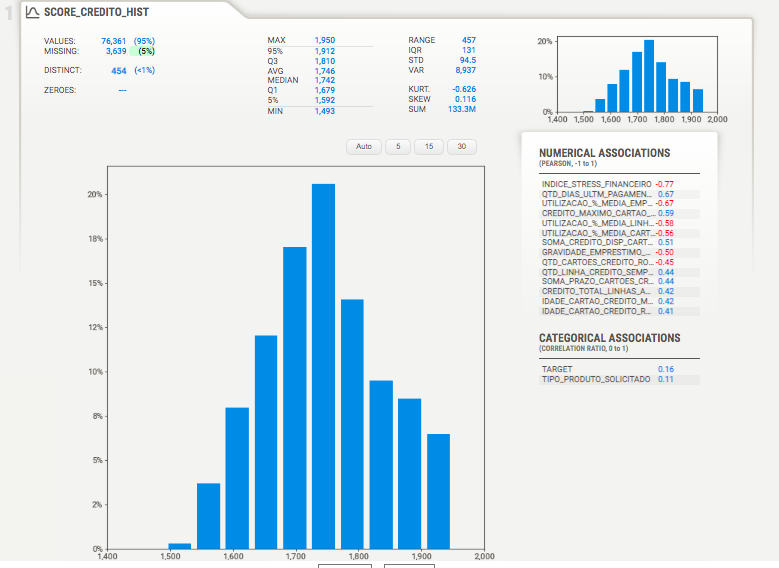

### **Aplicando com definição de uma variável target**

Para determinar uma variável como target, basta adicionar o parâmetro **target_feat** no comando sv.analyze, que é uma string com o nome que define a coluna target, vale destacar que esse parâmetro é opcional para todas as análises no featurewiz

Mas para isso devemos mudar o formato da coluna 'TARGET' para numérica, ao criar o objeto de configuração de variáveis, pois a mesma deve ser numérica ou booleana.

                                             |          | [  0%]   00:00 -> (? left)


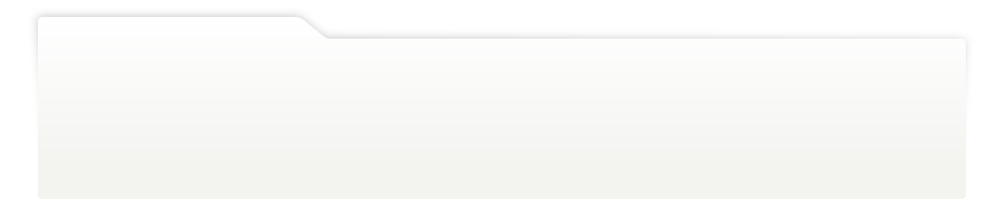
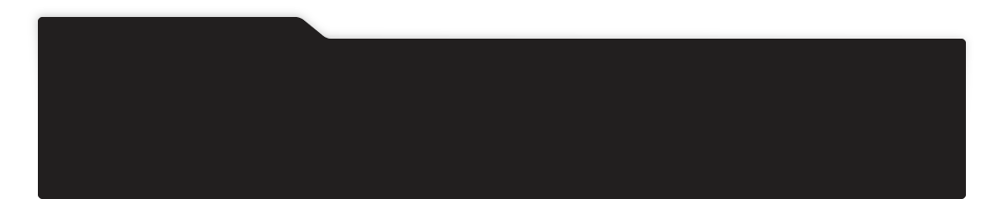
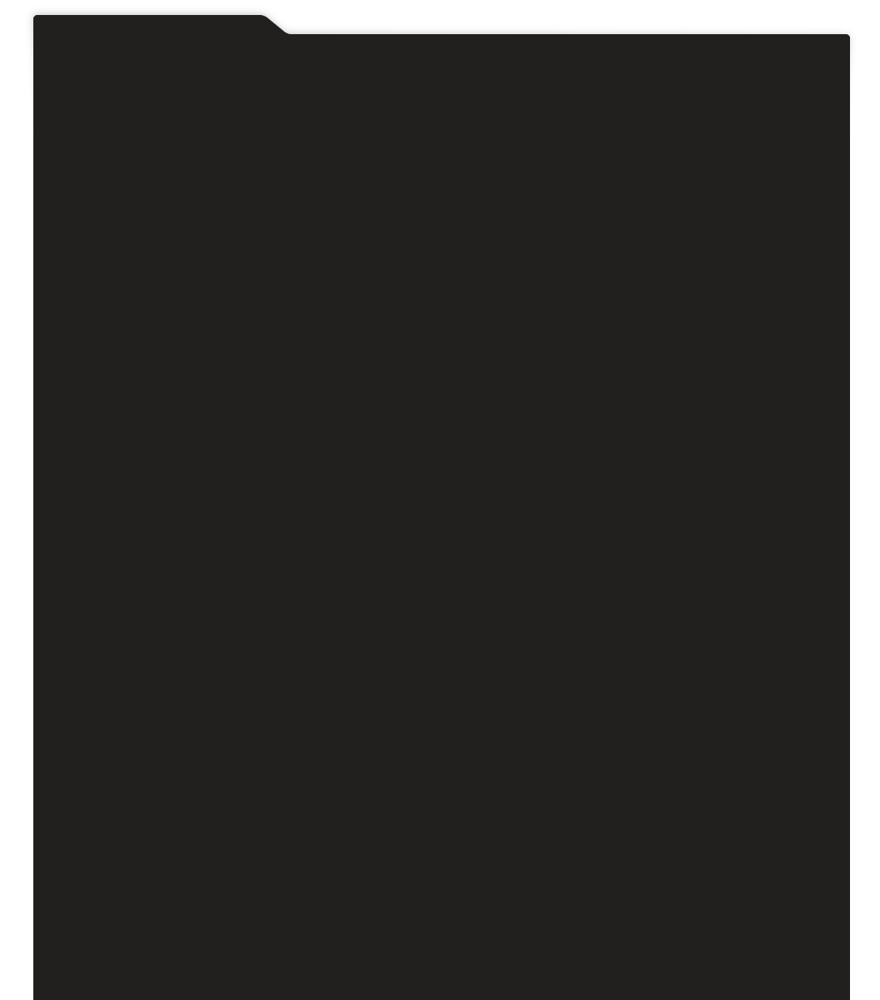
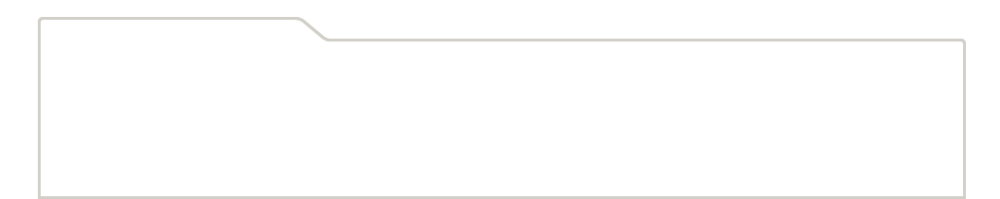
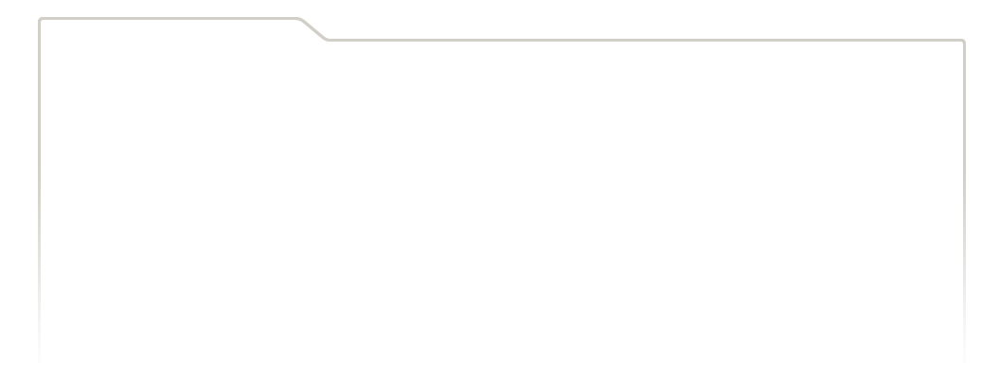
...
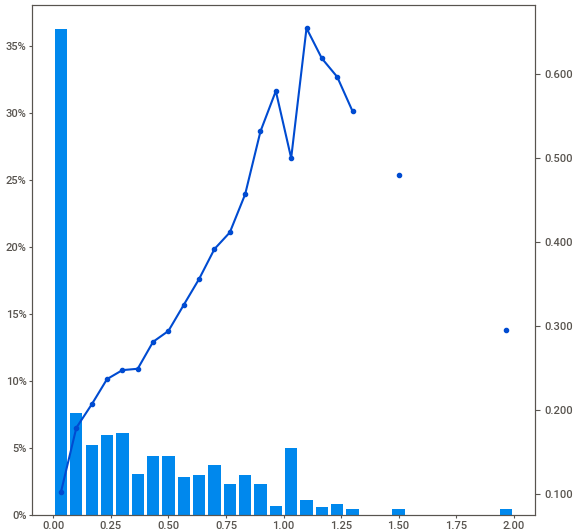
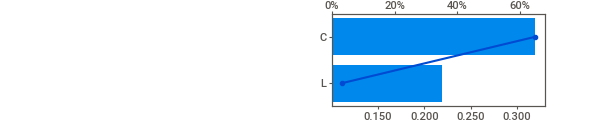
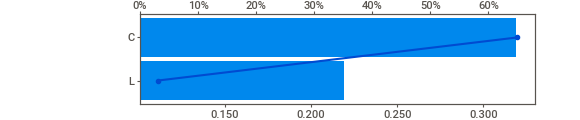
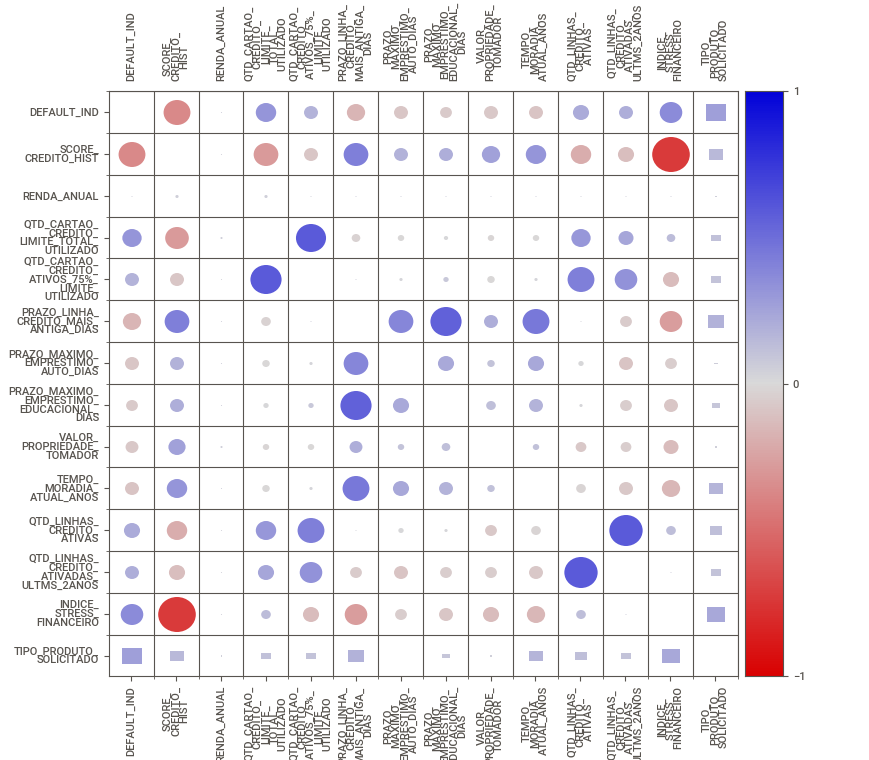
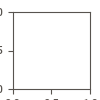

In [19]:
#Criando objeto de configuração de variáveis

vars_config = sv.FeatureConfig(skip=['CHAVE_CLIENTE'],
                 force_cat=['TIPO_PRODUTO_SOLICITADO'],
                 force_num=df_analise.drop(columns=['TIPO_PRODUTO_SOLICITADO']).columns.tolist())

#Gerando relatório
relatorio = sv.analyze([df_analise,'Base de Crédito'], feat_cfg=vars_config,target_feat='DEFAULT_IND')

#Visualizando relatório no notebook
relatorio.show_notebook()

**Destaque variável target**

No caso do relatório com o target, uma informação que utilizo bastante é a ordenação do target pela variável.

Abaixo como exemplo, temos o detalhamento da variável 'INDICE_STRESS_FINANCEIRO', e no histograma podemos verificar como o target (inadimplência) se distribui, vemos que quanto maior o valor da variável maior é a proporção de ocorrência do target, o que é um forte indicador de essa feature é uma boa preditora e deve ser considerada no desenvolvimento de um modelo.

Essa ordenação faz sentido quando analisamos conceitualmente a relação da variável com o target, visto que o 'INDICE_STRESS_FINANCEIRO' é uma medida diretamente proporcional a não capacidade de pagamento.

Vale destacar que esse detalhamento de medidas e do target está presente em todos os relatórios gerados pelo sweetviz, como nas análises seguintes de quebra de categorias intra base e entre bases distintas.


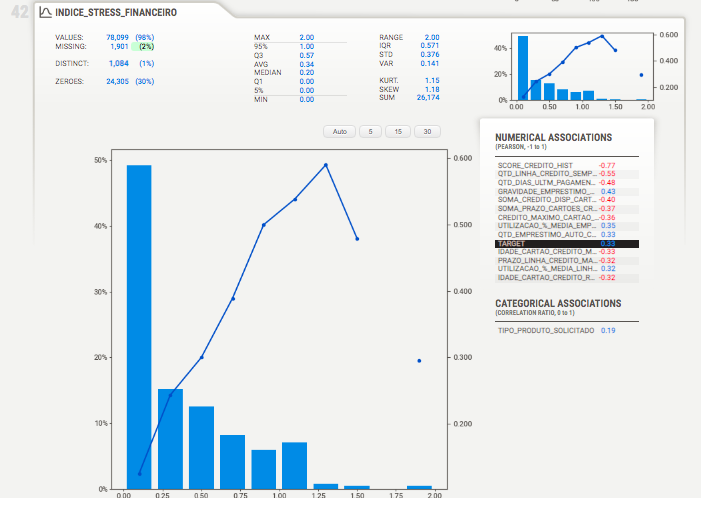

### **Aplicando comparação intra base**

1º Definimos o formato das variáveis como nos exemplos anteriores

2º aplicamos o sv.compare_intra com os seguintes parâmetros:

**souce_df** é o dataframe a ser analisado.

**condiction_series** é um pandas.series que contem a regra de comparação intra base de dados, no nosso exemplo vamos comparar os registros pela variável caategórica TIPO_PRODUTO_SOLICITADO, que pode assumir os valores C = Encargo ou L = Empréstimo.

**names** trata-se apenas da uma lista de dois string contendo os nomes das categorias, sendo o primeiro string o nome dos registros que atendem a regra do condiction_series (True) e o segundo os que não atendem a condição (False), no nosso exemplo são os registros que possuem valor C para variável TIPO_PRODUTO_SOLICITADO e as que possuem valor L para a mesma.

3º Visualizando relatório no notebook como nos exemplos anteriores.


                                             |          | [  0%]   00:00 -> (? left)


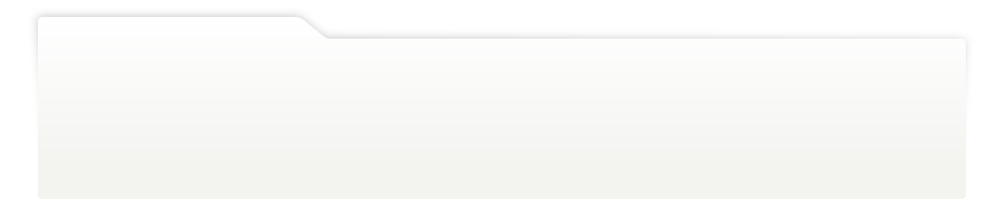
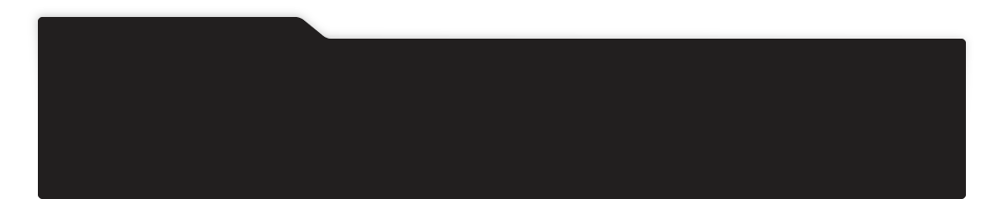
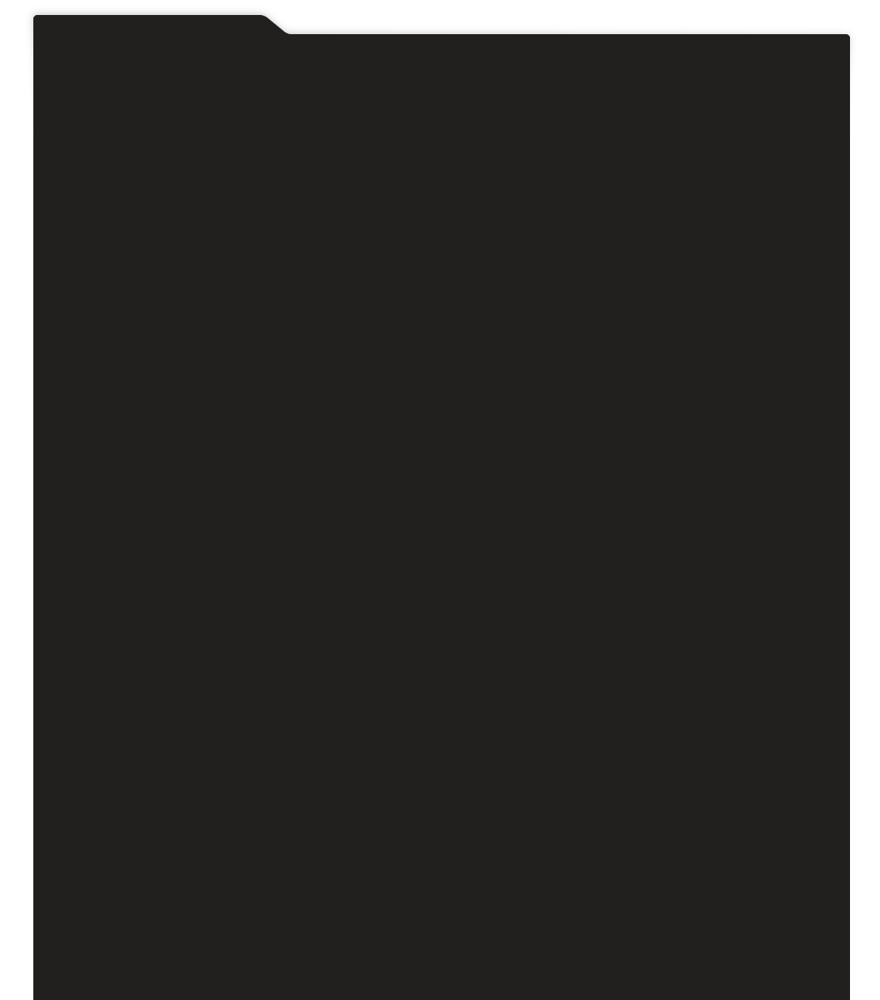
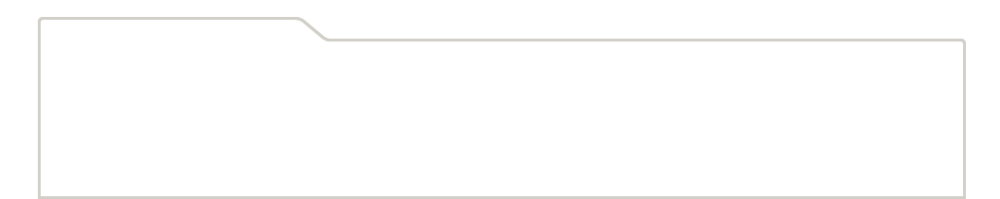
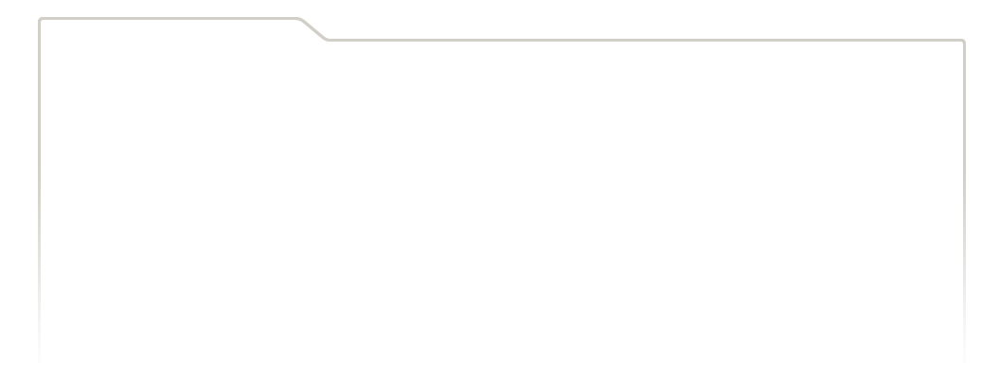
...
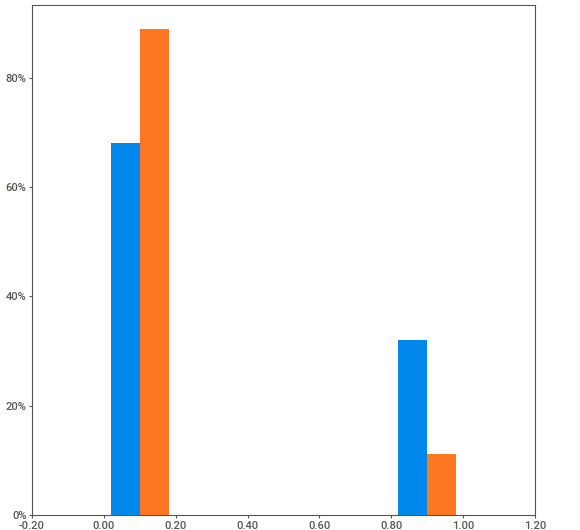
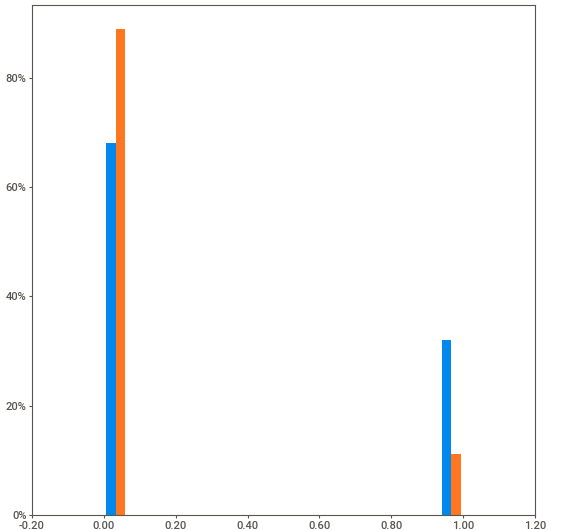
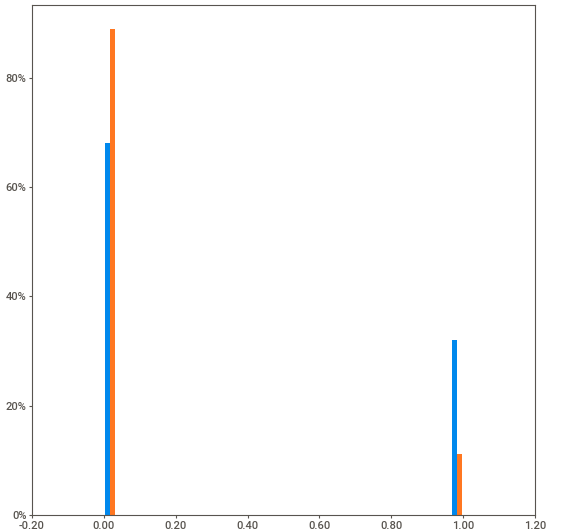
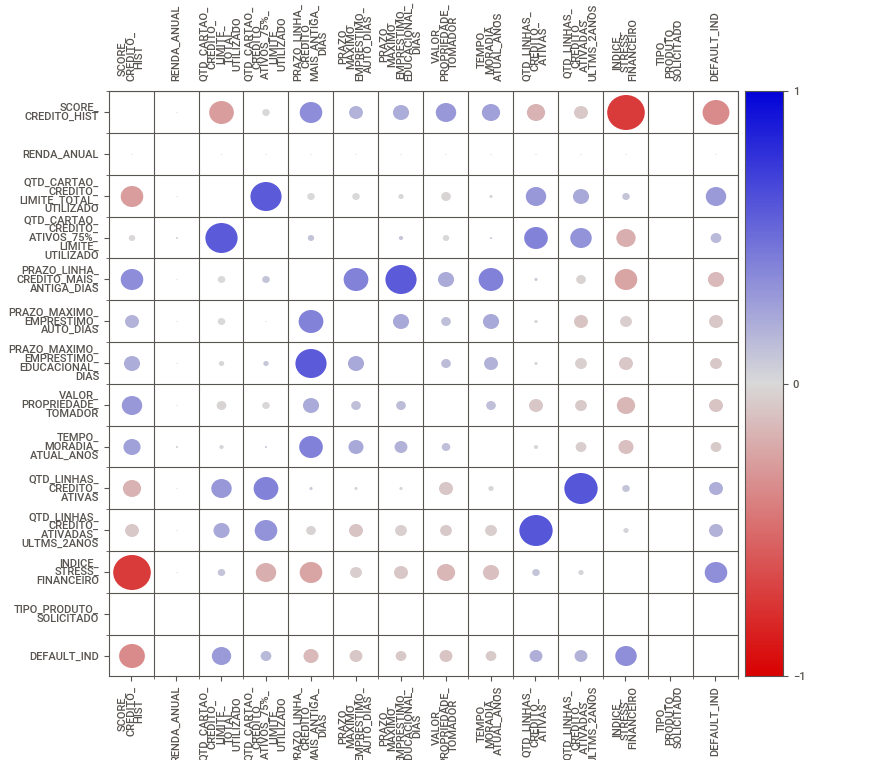
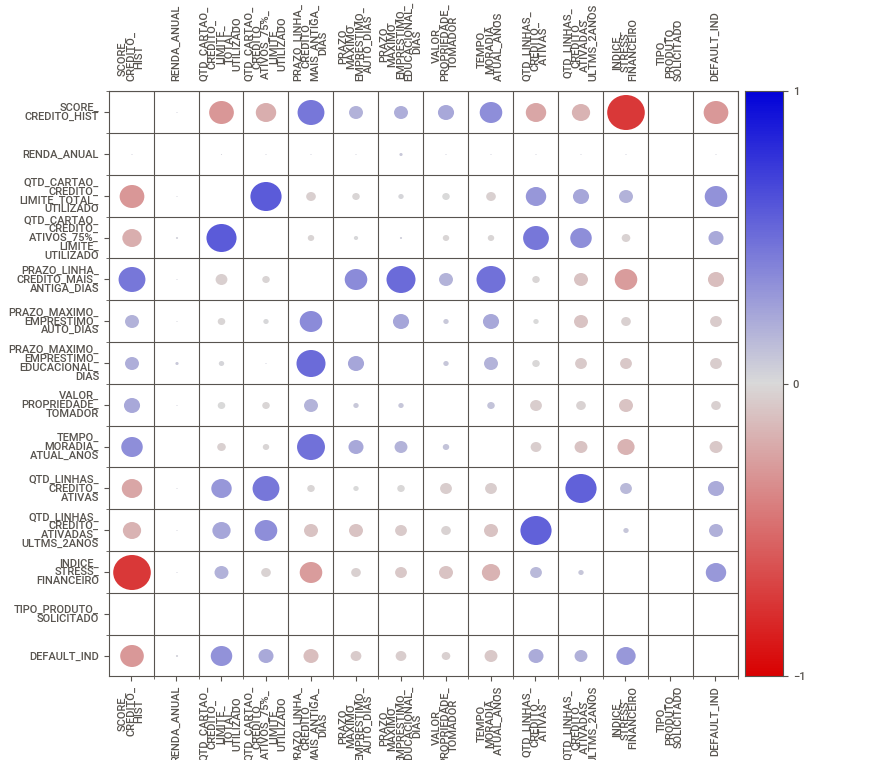

In [20]:
#1 - Definindo objeto de formato de campos
vars_config = sv.FeatureConfig(skip=['CHAVE_CLIENTE'],
                 force_cat=['TIPO_PRODUTO_SOLICITADO'],
                 force_num=df_analise.drop(columns=['TIPO_PRODUTO_SOLICITADO']).columns.tolist())

#2 - Gerando relatório de comparação
relatorio = sv.compare_intra(source_df=df_analise, condition_series=df_analise['TIPO_PRODUTO_SOLICITADO']=='C',
                             names=['Produco encargo','Produto empréstimo'],feat_cfg=vars_config)

#3 - Visualizando relatório no notebook
relatorio.show_notebook()

### **Aplicando em comparação de bases distintas**

Para aplicar esse exemplo, primeiramente vamos utilizar o train_test_split para dividir aleatóriamente nossa base de análise em duas, sendo um com 75% dos registros originais (train_df) e a segunda com os 25% complementares (test_df).

1º Definimos o formato das variáveis como nos exemplos anteriores

2º aplicamos sv.compare com os seguintes parâmetros:

  **source e compare** são listas contendo o dataframe e um string que atribua o nome de cada uma das bases de dados.

  os demais parâmetros seguem o mesmo padrão dos exemplos anteriores.

3º Visualizando relatório no notebook como nos exemplos anteriores.





Proporção base de treino: 75.00%
Proporção base de treino: 25.00%


                                             |          | [  0%]   00:00 -> (? left)


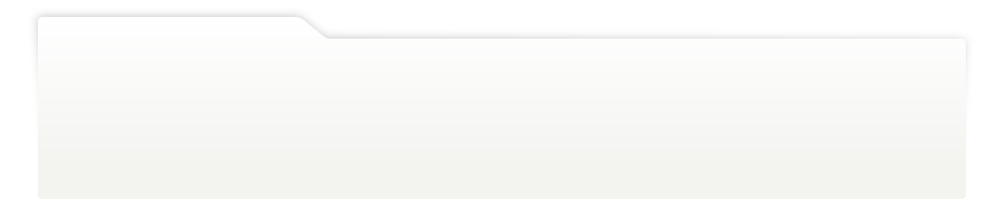
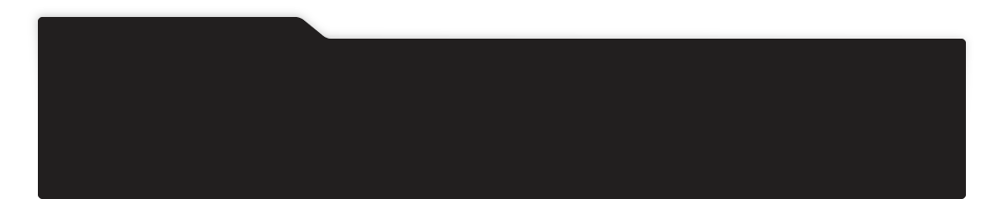
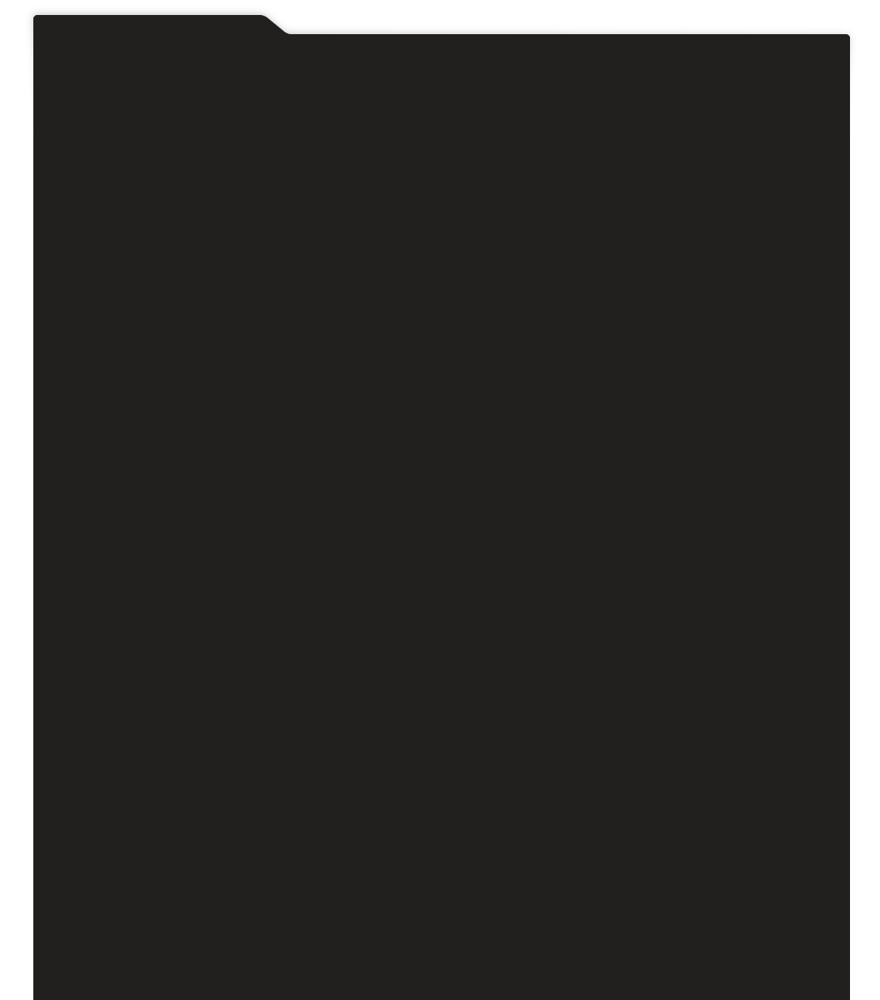
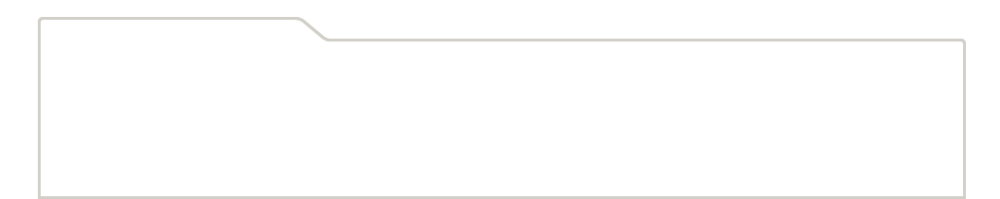
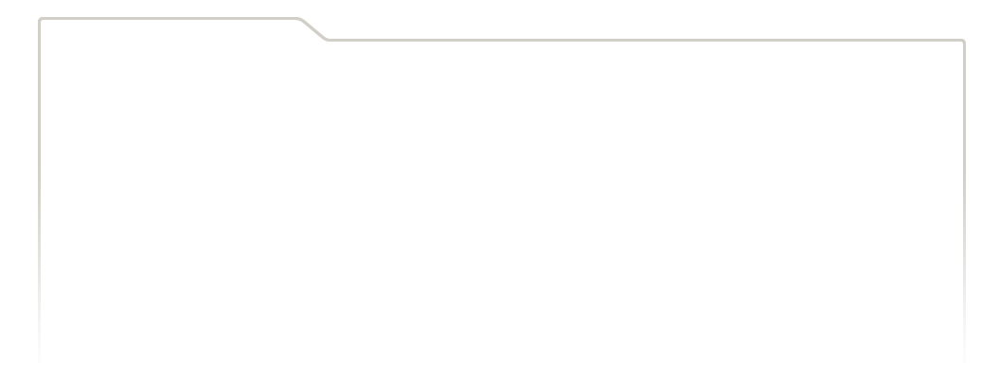
...
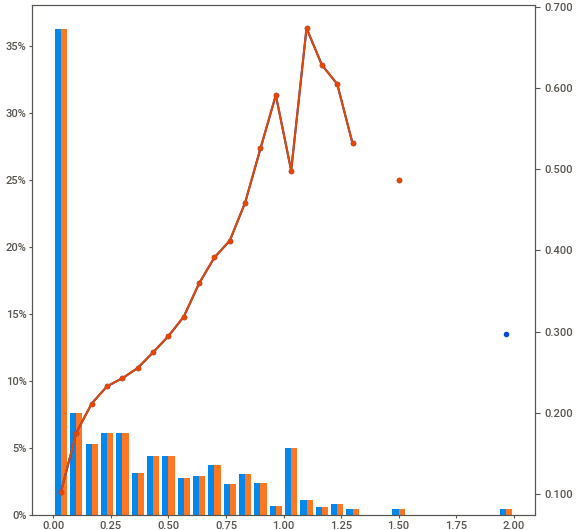
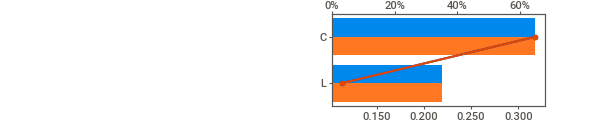
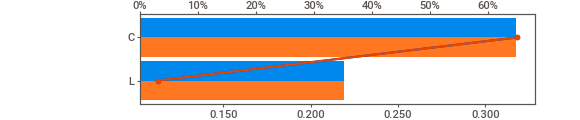
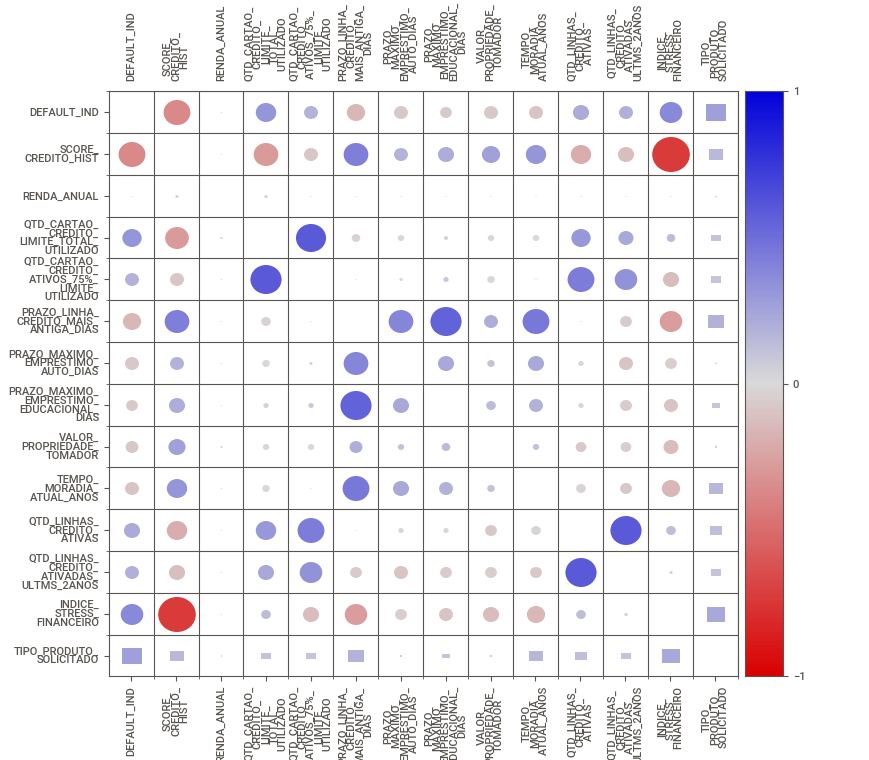
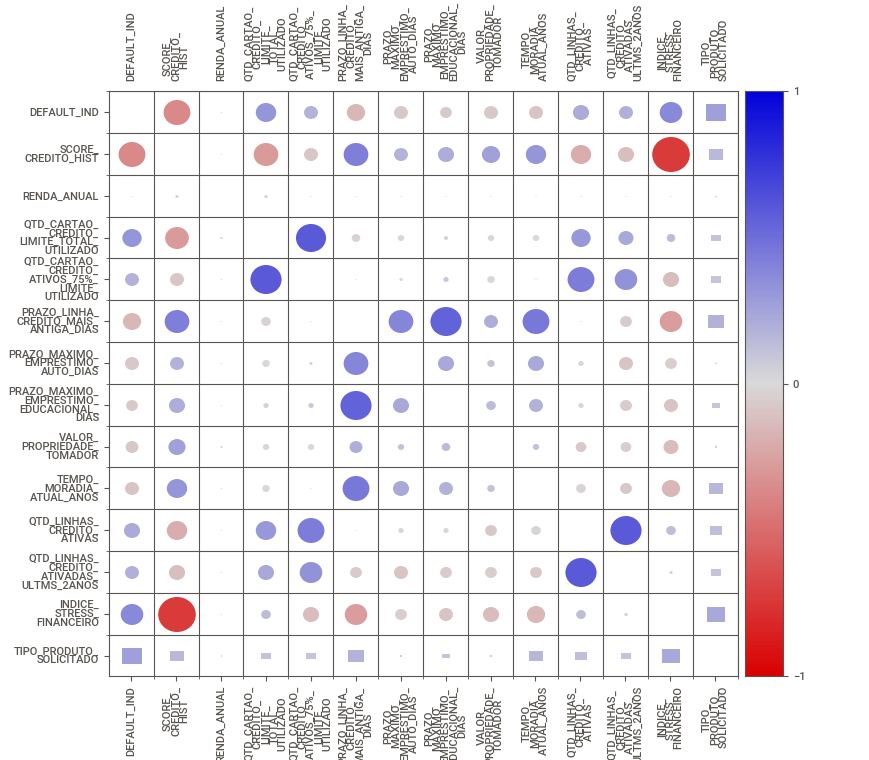

In [21]:
#Dividindo bases em treino e teste
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(df_analise, train_size=0.75)

#Verificando divisao de bases
prop_train = (train_df.shape[0]/df_analise.shape[0])
print(f'Proporção base de treino: {prop_train:,.2%}')
prop_test = (test_df.shape[0]/df_analise.shape[0])
print(f'Proporção base de treino: {prop_test:,.2%}',end=f'\n')

#1 - Definindo objeto de formato de campos
vars_config = sv.FeatureConfig(skip=['CHAVE_CLIENTE'],
                 force_cat=['TIPO_PRODUTO_SOLICITADO'],
                 force_num=df_analise.drop(columns=['TIPO_PRODUTO_SOLICITADO']).columns.tolist())

#2 - Gerando relatório de comparação
relatorio = sv.compare(source=[train_df,'Base de treino'], compare=[train_df,'Base de teste'],feat_cfg=vars_config,
                       target_feat='DEFAULT_IND')

#3 - Visualizando relatório no notebook
relatorio.show_notebook()